<a href="https://colab.research.google.com/github/Covpet/ENHANCING-PLANT-DISEASE-DETECTION-WITH-DEEP-LEARNING-MODELS/blob/main/plant_disease_detection_(cassava_and_maize).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [33]:
!pip install keras-tuner --quiet

### Import Important libraries from the python package

In [34]:
import os
import cv2

import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import shutil
import tensorflow as tf
from PIL import ImageFile
import keras_tuner as kt
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D , Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import metrics
from tensorflow.keras.applications import MobileNetV2, ResNet50, VGG16
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import ResNet50

# Mount Google drive

In [35]:
# Import and mount Google Drive.
from google.colab import drive

drive.mount("/content/drive")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# DATA PREPROCESSING

# Base directory structure for maize, Clean up was done for maize due to corrupted images

Displaying images from folder: fall armyworm


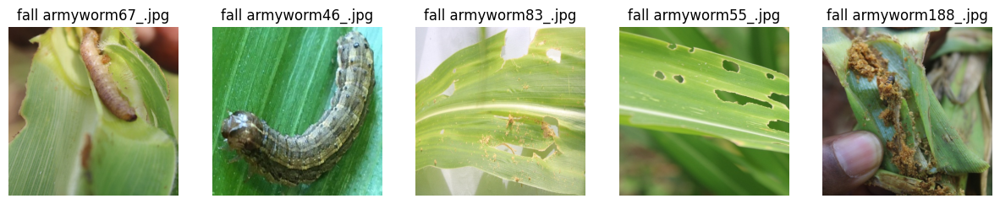

Displaying images from folder: grasshoper


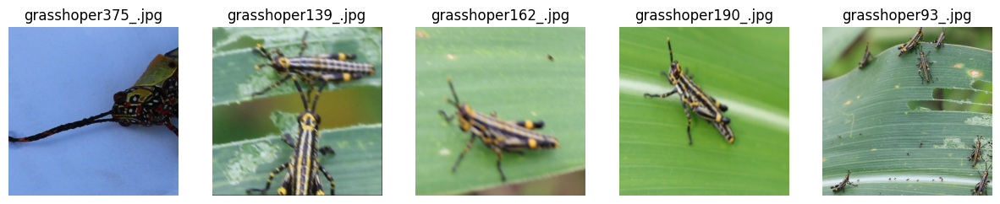

Displaying images from folder: healthy


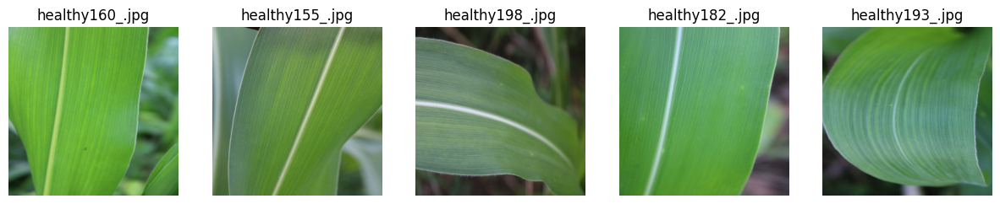

Displaying images from folder: leaf beetle


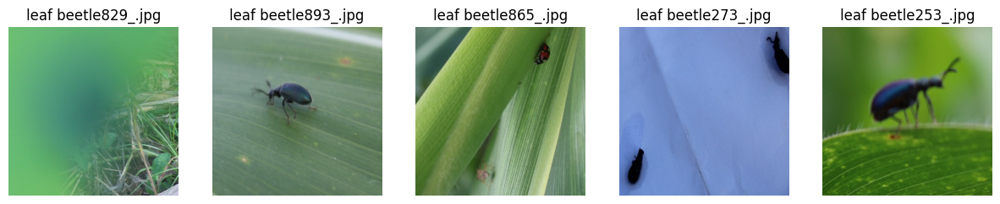

Displaying images from folder: leaf blight


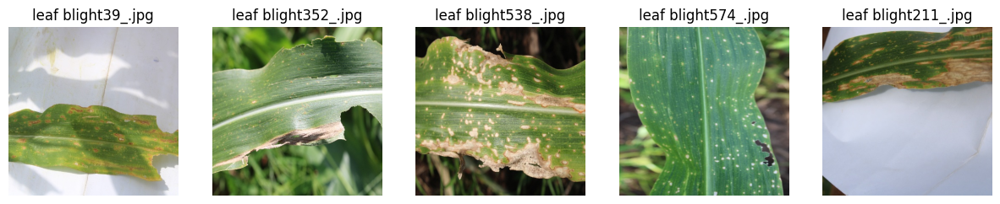

Displaying images from folder: leaf spot


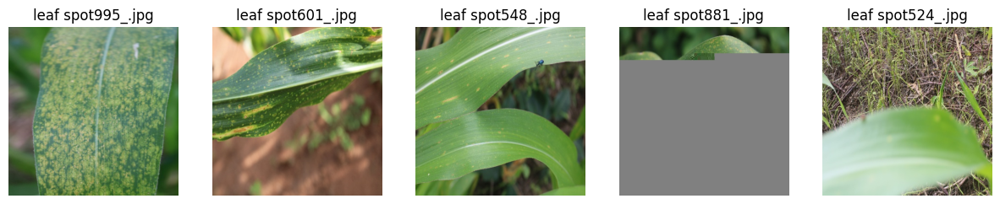

Displaying images from folder: streak virus


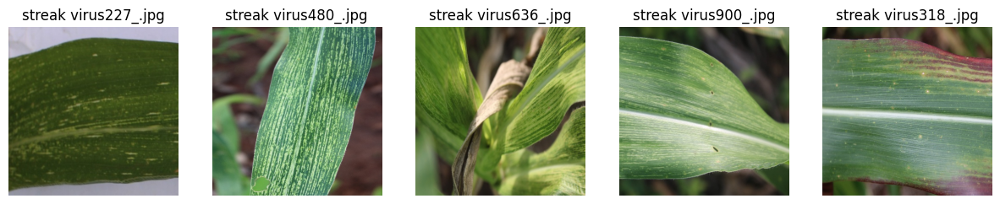

In [36]:
# Define base directory and folder names
base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify if the file is a valid image
        return True
    except (IOError, SyntaxError) as e:
        return False

# Function to remove invalid image files
def remove_invalid_images(folder_path):
    files = os.listdir(folder_path)
    for file in files:
        file_path = os.path.join(folder_path, file)
        if not is_valid_image(file_path):
            print(f"Removing invalid file: {file}")
            os.remove(file_path)

# Function to display a sample of 5 images from each folder
def display_images_from_folders(base_dir, folders, num_images=5):
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        print(f"Displaying images from folder: {folder}")

        # Remove invalid images before displaying
        remove_invalid_images(folder_path)

        # Get all valid image files in the folder after cleanup
        files = [f for f in os.listdir(folder_path) if is_valid_image(os.path.join(folder_path, f))]

        if len(files) < num_images:
            print(f"Not enough valid images in {folder}. Found only {len(files)} valid images.")
            continue

        # Randomly select images to display
        selected_files = random.sample(files, num_images)

        # Create a subplot to display images
        fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

        for i, file in enumerate(selected_files):
            img_path = os.path.join(folder_path, file)
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(file)

        plt.show()

# Call the function to display images and remove invalid ones
display_images_from_folders(base_dir, folders)

#  Directory structure for cassava


                                          image_path             class
0  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
1  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
2  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
3  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
4  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight


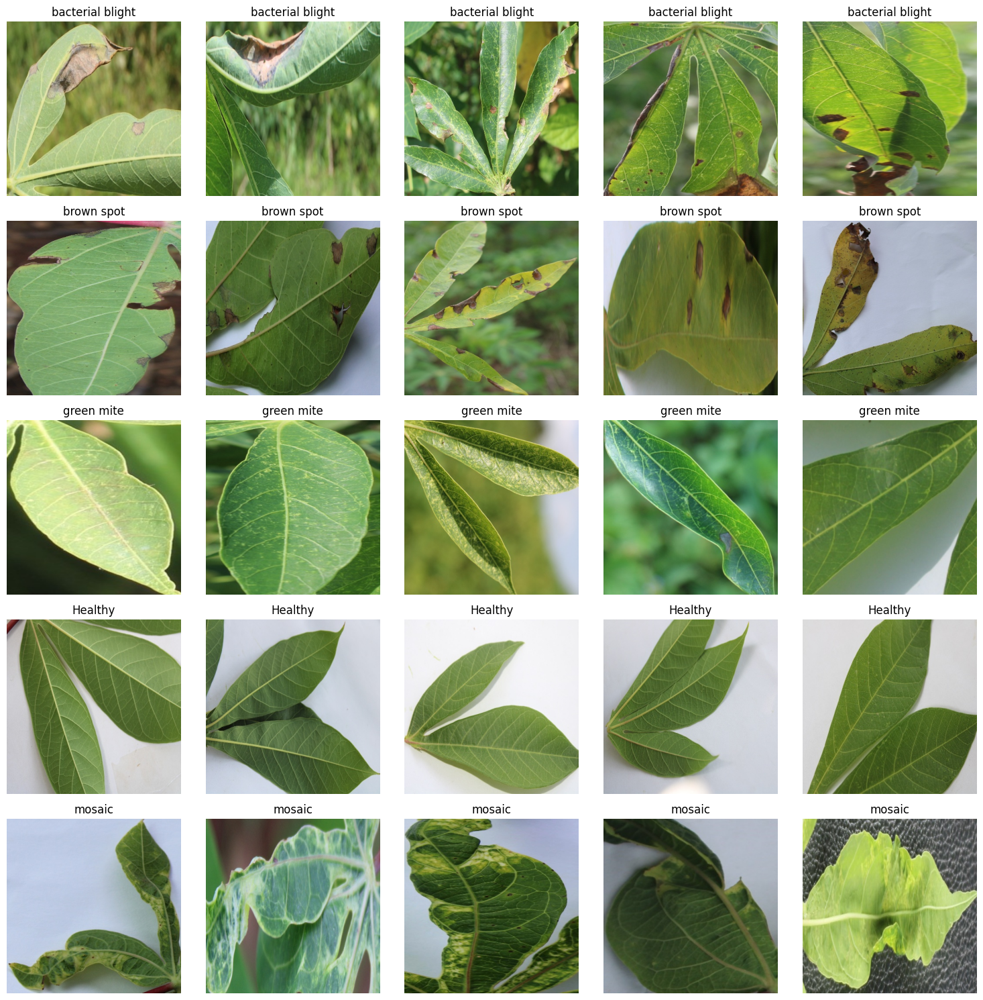

In [37]:
# Directory structure
base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# List to store image paths and their corresponding classes
image_paths = []
image_classes = []

# Iterate through each folder and collect image paths
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Adjust if necessary for different image formats
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(folder)

# Create a DataFrame
df_images = pd.DataFrame({
    'image_path': image_paths,
    'class': image_classes
})

# Show the DataFrame with image paths and their classes
print(df_images.head())

# Set up a plot to display the images
num_images_per_class = 5  # Show 5 images per class
fig, axes = plt.subplots(nrows=len(folders), ncols=num_images_per_class, figsize=(15, 15))

# Loop through each class and display 5 images
for i, folder in enumerate(folders):
    # Filter images of the current class
    class_images = df_images[df_images['class'] == folder].head(num_images_per_class)

    for j, (image_path, label) in enumerate(zip(class_images['image_path'], class_images['class'])):
        img = Image.open(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(label)

plt.tight_layout()
plt.show()

# Maize and Cassava info counts

In [38]:
# Function to load and prepare the DataFrame
def load_data(base_dir, folders):
    image_paths = []
    image_classes = []

    # Iterate through each folder and collect image paths
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        for filename in os.listdir(folder_path):
            if filename.endswith(('.png', '.jpg', '.jpeg')):  # Adjust if necessary for different image formats
                image_paths.append(os.path.join(folder_path, filename))
                image_classes.append(folder)

    # Create a DataFrame
    df_images = pd.DataFrame({
        'image_path': image_paths,
        'class': image_classes
    })

    return df_images

# For Maize
base_dir_maize = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders_maize = [
    'fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus'
]

df_maize = load_data(base_dir_maize, folders_maize)

# For Cassava
base_dir_cassava = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders_cassava = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic'
]

df_cassava = load_data(base_dir_cassava, folders_cassava)

# Count the number of images per class
maize_class_counts = df_maize['class'].value_counts()
cassava_class_counts = df_cassava['class'].value_counts()

# Count the file formats for both datasets
maize_file_formats = df_maize['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()
cassava_file_formats = df_cassava['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()

# Display counts for Maize
print("Maize Class Counts:")
print(maize_class_counts)
print("\nMaize File Format Counts:")
print(maize_file_formats)

# Display counts for Cassava
print("\nCassava Class Counts:")
print(cassava_class_counts)
print("\nCassava File Format Counts:")
print(cassava_file_formats)

Maize Class Counts:
class
leaf spot        1249
streak virus     1002
leaf blight       998
leaf beetle       938
grasshoper        683
fall armyworm     285
healthy           206
Name: count, dtype: int64

Maize File Format Counts:
image_path
jpg    5361
Name: count, dtype: int64

Cassava Class Counts:
class
bacterial blight    2772
brown spot          1506
Healthy             1283
mosaic              1235
green mite          1154
Name: count, dtype: int64

Cassava File Format Counts:
image_path
jpg    7950
Name: count, dtype: int64


# Exploratory data Analysis for maize and cassava

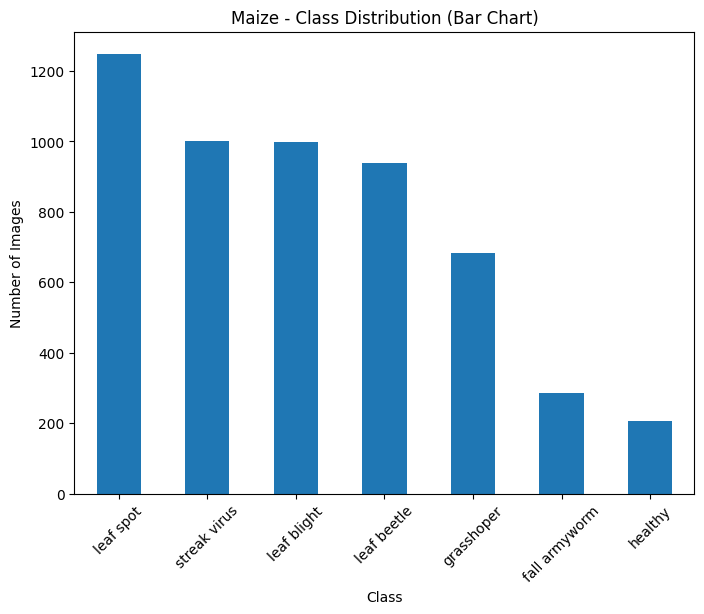

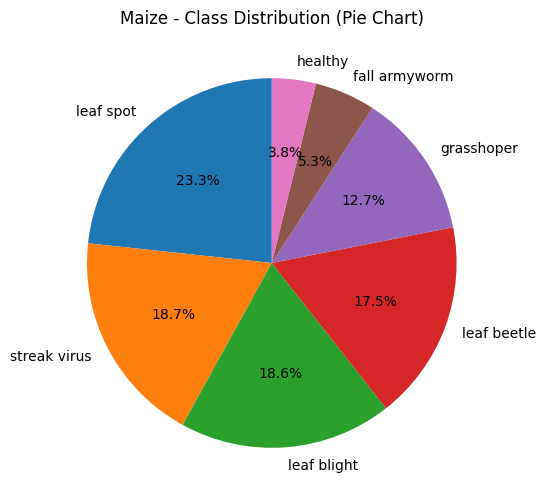

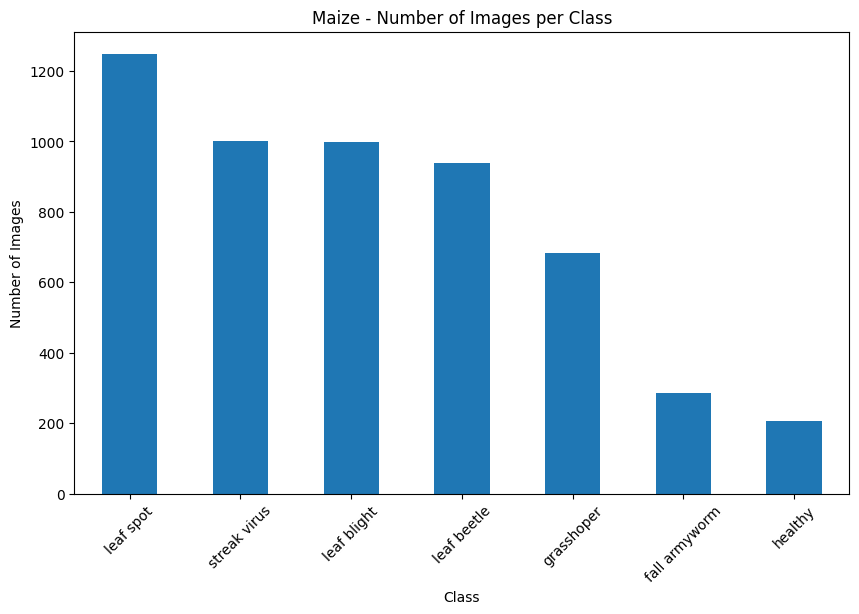

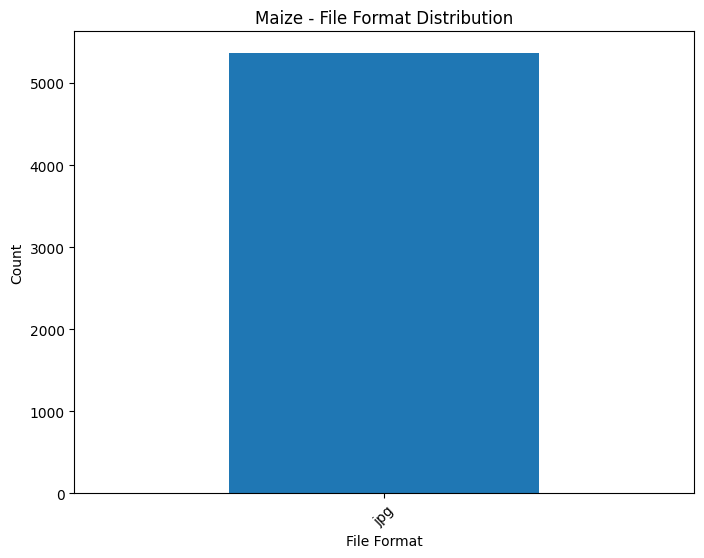

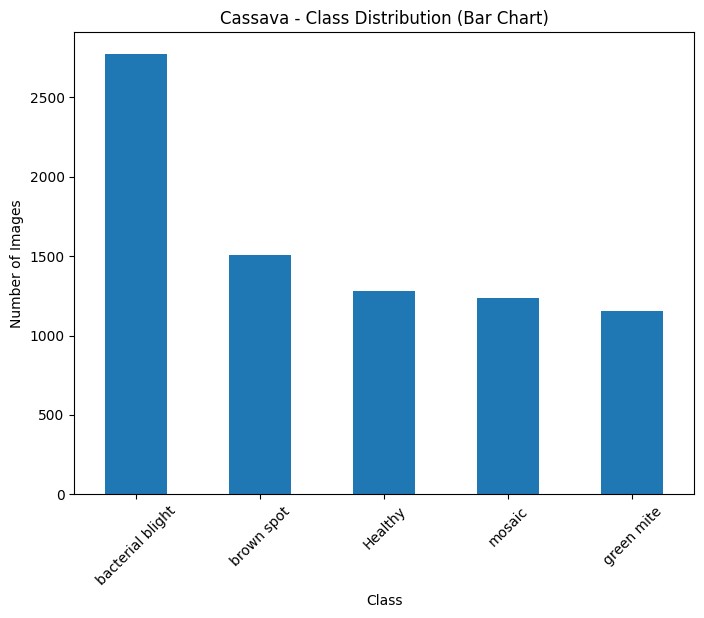

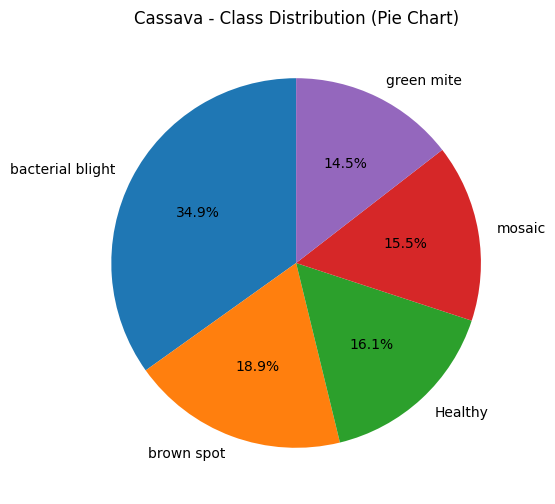

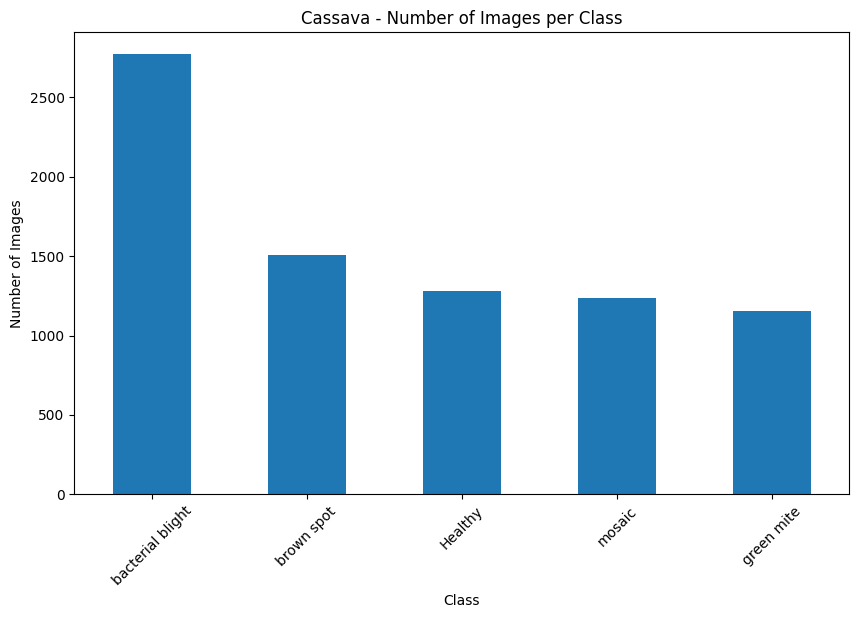

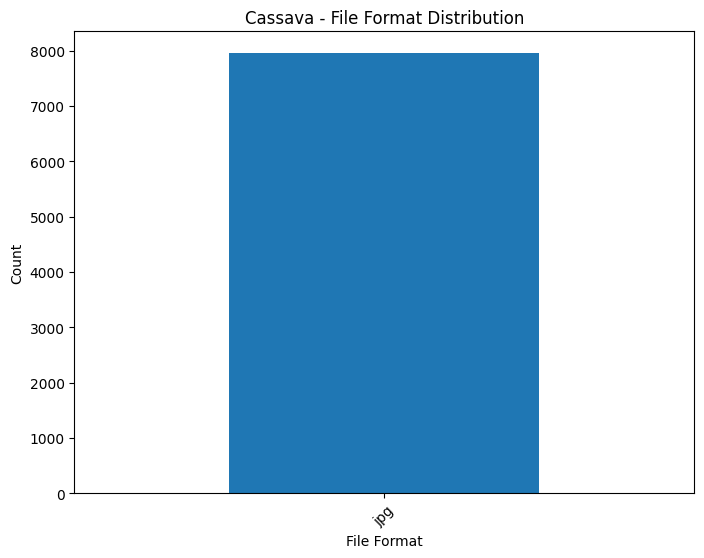

In [39]:
# For Maize
base_dir_maize = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders_maize = [
    'fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus'
]

df_maize = load_data(base_dir_maize, folders_maize)

# For Cassava
base_dir_cassava = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders_cassava = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic'
]

df_cassava = load_data(base_dir_cassava, folders_cassava)

# EDA for Maize dataset and cassava
def plot_eda(df_images, title):
    # Class distribution (Bar Chart)
    plt.figure(figsize=(8, 6))
    df_images['class'].value_counts().plot(kind='bar')
    plt.title(f'{title} - Class Distribution (Bar Chart)')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

    # Class distribution (Pie Chart)
    plt.figure(figsize=(8, 6))
    df_images['class'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90)
    plt.title(f'{title} - Class Distribution (Pie Chart)')
    plt.ylabel('')
    plt.show()

    # Number of Images per Class (Bar Chart)
    class_counts = df_images['class'].value_counts()
    class_counts.plot(kind='bar', figsize=(10, 6))
    plt.title(f'{title} - Number of Images per Class')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

    # File Format Distribution (Bar Chart)
    file_formats = df_images['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()
    file_formats.plot(kind='bar', figsize=(8, 6))
    plt.title(f'{title} - File Format Distribution')
    plt.xlabel('File Format')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Plot EDA for Maize dataset
plot_eda(df_maize, 'Maize')

# Plot EDA for Cassava dataset
plot_eda(df_cassava, 'Cassava')

In [40]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

## Preparing Image dataset for both images and creating a data frame


                                          image_path                class
0  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
1  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
2  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
3  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
4  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm


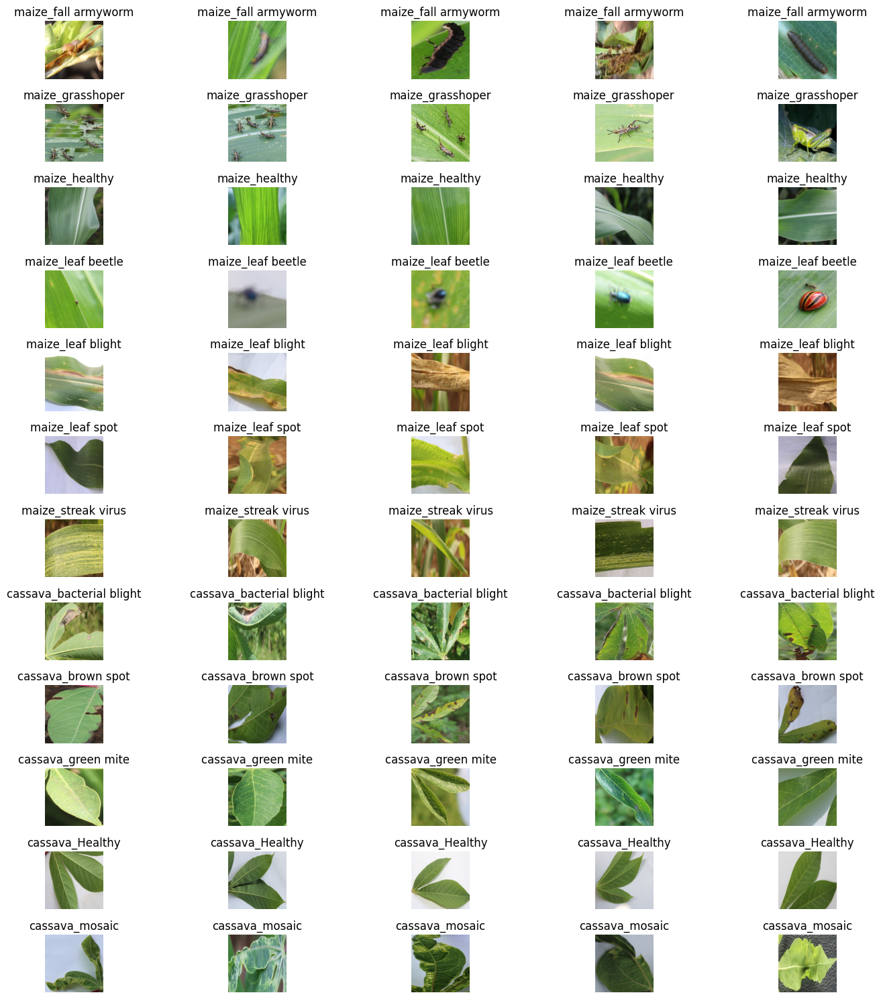

In [41]:
# Define base directories for both datasets
maize_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
cassava_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'

# Folder names for Maize dataset
maize_folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Folder names for Cassava dataset
cassava_folders = ['bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify if the file is a valid image
        return True
    except (IOError, SyntaxError) as e:
        return False

# Function to remove invalid image files
def remove_invalid_images(folder_path):
    files = os.listdir(folder_path)
    for file in files:
        file_path = os.path.join(folder_path, file)
        if not is_valid_image(file_path):
            print(f"Removing invalid file: {file}")
            os.remove(file_path)

# Remove invalid images before training for both datasets
for folder in maize_folders:
    remove_invalid_images(os.path.join(maize_base_dir, folder))
for folder in cassava_folders:
    remove_invalid_images(os.path.join(cassava_base_dir, folder))

# Create a DataFrame for the images in both datasets
image_paths = []
image_classes = []

# Maize dataset
for folder in maize_folders:
    folder_path = os.path.join(maize_base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(f"maize_{folder}")

# Cassava dataset
for folder in cassava_folders:
    folder_path = os.path.join(cassava_base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(f"cassava_{folder}")

# Create a DataFrame
df_images = pd.DataFrame({
    'image_path': image_paths,
    'class': image_classes
})

# Show the DataFrame with image paths and their classes
print(df_images.head())

# Set up a plot to display the images
num_images_per_class = 5  # Show 5 images per class
fig, axes = plt.subplots(nrows=len(maize_folders) + len(cassava_folders), ncols=num_images_per_class, figsize=(15, 15))

# Loop through each class and display 5 images
for i, folder in enumerate(maize_folders + cassava_folders):
    # Filter images of the current class
    class_images = df_images[df_images['class'].str.contains(folder)].head(num_images_per_class)

    for j, (image_path, label) in enumerate(zip(class_images['image_path'], class_images['class'])):
        img = Image.open(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(label)

plt.tight_layout()
plt.show()

### Printing number of unique classes

In [42]:
unique_classes = df_images['class'].nunique()
print(f"Number of classes in the dataset: {unique_classes}")

Number of classes in the dataset: 12


### Combining Maize and Cassava Dataframes and creating splits into train, test and validation (80%, 10%, 10%)

In [43]:
# Combine the Maize and Cassava DataFrames
df_combined = pd.concat([df_maize, df_cassava], ignore_index=True)

# Split into training (80%), testing (10%), and validation (10%)
train_df, test_df = train_test_split(df_combined, test_size=0.2, stratify=df_combined['class'], random_state=42)
valid_df, test_df = train_test_split(test_df, test_size=0.5, stratify=test_df['class'], random_state=42)

# Display the counts for each dataset to verify
print(f"Training set: {train_df.shape[0]} images")
print(f"Validation set: {valid_df.shape[0]} images")
print(f"Testing set: {test_df.shape[0]} images")

# Optional: Check the distribution of classes in each set
print("\nTraining set class distribution:")
print(train_df['class'].value_counts())

print("\nValidation set class distribution:")
print(valid_df['class'].value_counts())

print("\nTesting set class distribution:")
print(test_df['class'].value_counts())

Training set: 10648 images
Validation set: 1331 images
Testing set: 1332 images

Training set class distribution:
class
bacterial blight    2218
brown spot          1205
Healthy             1026
leaf spot            999
mosaic               988
green mite           923
streak virus         802
leaf blight          798
leaf beetle          750
grasshoper           546
fall armyworm        228
healthy              165
Name: count, dtype: int64

Validation set class distribution:
class
bacterial blight    277
brown spot          150
Healthy             128
leaf spot           125
mosaic              123
green mite          115
leaf blight         100
streak virus        100
leaf beetle          94
grasshoper           69
fall armyworm        29
healthy              21
Name: count, dtype: int64

Testing set class distribution:
class
bacterial blight    277
brown spot          151
Healthy             129
leaf spot           125
mosaic              124
green mite          116
leaf blight    

In [44]:
!pip install keras-tuner --quiet

### Image Data Generator to load and Augment Images in Batches

In [45]:
# Data generators to load and augment images in batches
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
# Train, valid and test generator
train_generator = train_datagen.flow_from_dataframe(dataframe=train_df, directory=None,
                                                    x_col='image_path', y_col='class',
                                                    target_size=(150, 150), batch_size=32,
                                                    class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(dataframe=valid_df, directory=None,
                                                    x_col='image_path', y_col='class',
                                                    target_size=(150, 150), batch_size=32,
                                                    class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(dataframe=test_df, directory=None,
                                                  x_col='image_path', y_col='class',
                                                  target_size=(150, 150), batch_size=32,
                                                  class_mode='categorical')

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.


# Building of Models

## CNN Models (Non pre trained)

## 10 Epochs

In [46]:
# Build the CNN Model
model= Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])
# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define a checkpoint to save the best model during training
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# Train the model
history = model.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step - accuracy: 0.1897 - loss: 2.3391
Epoch 1: val_loss improved from inf to 1.93282, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 423ms/step - accuracy: 0.1898 - loss: 2.3388 - val_accuracy: 0.3080 - val_loss: 1.9328
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.3013 - loss: 1.9940
Epoch 2: val_loss improved from 1.93282 to 1.64453, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 139s 416ms/step - accuracy: 0.3013 - loss: 1.9939 - val_accuracy: 0.4020 - val_loss: 1.6445
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.3762 - loss: 1.7878
Epoch 3: val_loss improved from 1.64453 to 1.43184, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 420ms/step - accuracy: 0.3762 - loss: 1.7877 - val_accuracy: 0.4884 - val_loss: 1.4318
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step - accuracy: 0.4262 - loss: 1.6221
Epoch 4: val_loss improved from 1.43184 to 1.39111, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 415ms/step - accuracy: 0.4262 - loss: 1.6220 - val_accuracy: 0.4944 - val_loss: 1.3911
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.4819 - loss: 1.4694
Epoch 5: val_loss improved from 1.39111 to 1.28687, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 412ms/step - accuracy: 0.4819 - loss: 1.4692 - val_accuracy: 0.5432 - val_loss: 1.2869
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step - accuracy: 0.5366 - loss: 1.3390
Epoch 6: val_loss improved from 1.28687 to 1.04240, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 409ms/step - accuracy: 0.5366 - loss: 1.3389 - val_accuracy: 0.6386 - val_loss: 1.0424
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.5732 - loss: 1.2177
Epoch 7: val_loss improved from 1.04240 to 0.98291, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 411ms/step - accuracy: 0.5732 - loss: 1.2178 - val_accuracy: 0.6544 - val_loss: 0.9829
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.5929 - loss: 1.1726
Epoch 8: val_loss improved from 0.98291 to 0.97633, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 420ms/step - accuracy: 0.5929 - loss: 1.1726 - val_accuracy: 0.6627 - val_loss: 0.9763
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.6013 - loss: 1.1287
Epoch 9: val_loss improved from 0.97633 to 0.89300, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 412ms/step - accuracy: 0.6013 - loss: 1.1287 - val_accuracy: 0.6724 - val_loss: 0.8930
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.6201 - loss: 1.0856
Epoch 10: val_loss did not improve from 0.89300
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 413ms/step - accuracy: 0.6201 - loss: 1.0857 - val_accuracy: 0.6814 - val_loss: 0.9236
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.6434 - loss: 1.0236
Epoch 11: val_loss improved from 0.89300 to 0.87629, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 425ms/step - accuracy: 0.6434 - loss: 1.0237 - val_accuracy: 0.6957 - val_loss: 0.8763
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.6540 - loss: 0.9948
Epoch 12: val_loss improved from 0.87629 to 0.81014, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 419ms/step - accuracy: 0.6540 - loss: 0.9948 - val_accuracy: 0.7183 - val_loss: 0.8101
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.6621 - loss: 0.9762
Epoch 13: val_loss improved from 0.81014 to 0.74572, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 139s 415ms/step - accuracy: 0.6621 - loss: 0.9762 - val_accuracy: 0.7340 - val_loss: 0.7457
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.6606 - loss: 0.9474
Epoch 14: val_loss did not improve from 0.74572
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 412ms/step - accuracy: 0.6606 - loss: 0.9474 - val_accuracy: 0.7415 - val_loss: 0.7799
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.6734 - loss: 0.9391
Epoch 15: val_loss did not improve from 0.74572
333/333 ━━━━━━━━━━━━━━━━━━━━ 136s 409ms/step - accuracy: 0.6734 - loss: 0.9390 - val_accuracy: 0.6897 - val_loss: 0.9110
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.6915 - loss: 0.9031
Epoch 16: val_loss improved from 0.74572 to 0.66766, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 410ms/step - accuracy: 0.6915 - loss: 0.9031 - val_accuracy: 0.7596 - val_loss: 0.6677
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.6918 - loss: 0.8639
Epoch 17: val_loss did not improve from 0.66766
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 415ms/step - accuracy: 0.6918 - loss: 0.8639 - val_accuracy: 0.7348 - val_loss: 0.7922
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.7035 - loss: 0.8575
Epoch 18: val_loss did not improve from 0.66766
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 413ms/step - accuracy: 0.7035 - loss: 0.8575 - val_accuracy: 0.7250 - val_loss: 0.7987
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.6994 - loss: 0.8421
Epoch 19: val_loss did not improve from 0.66766
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 412ms/step - accuracy: 0.6994 - loss: 0.8421 - val_accuracy: 0.7536 - val_loss: 0.7006
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.7052 - loss: 0.8313
Epoch 20: val_lo

## training and validation on Cnn on 10 epoch

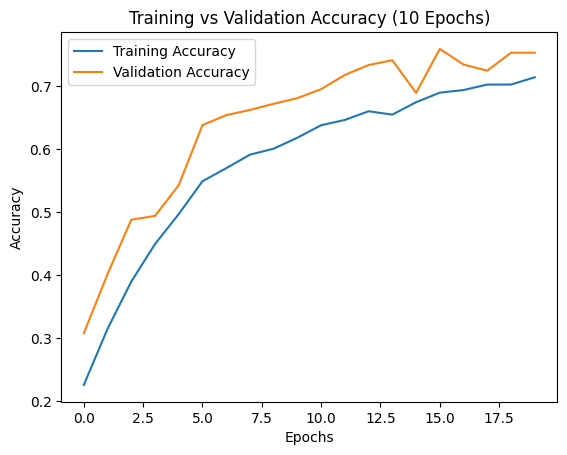

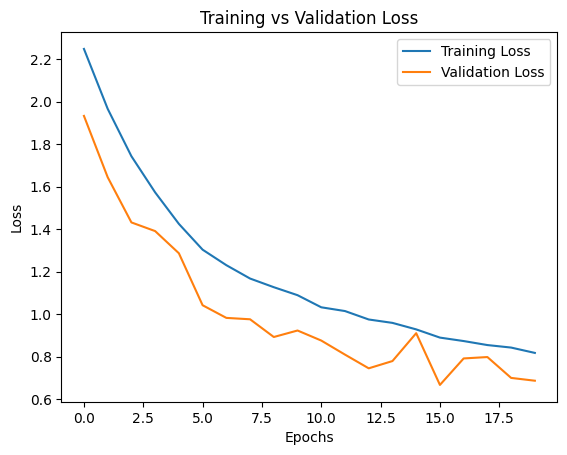

In [47]:
# Plot the training and validation accuracy fo 10 Epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (10 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Evaluation on cnn model on 10 epoch


42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.07      0.06      0.07       129
bacterial blight       0.20      0.21      0.21       277
      brown spot       0.13      0.13      0.13       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.00      0.00      0.00        68
      green mite       0.04      0.05      0.04       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.03      0.03      0.03        94
     leaf blight       0.04      0.03      0.04       100
       leaf spot       0.11      0.17      0.13       125
          mosaic       0.11      0.07      0.09       124
    streak virus       0.09      0.10      0.10       100

        accuracy                           0.10      1332
       macro avg       0.07      0.07      0.07      1332
    weighted avg       0.10      0.10      0.10      1332



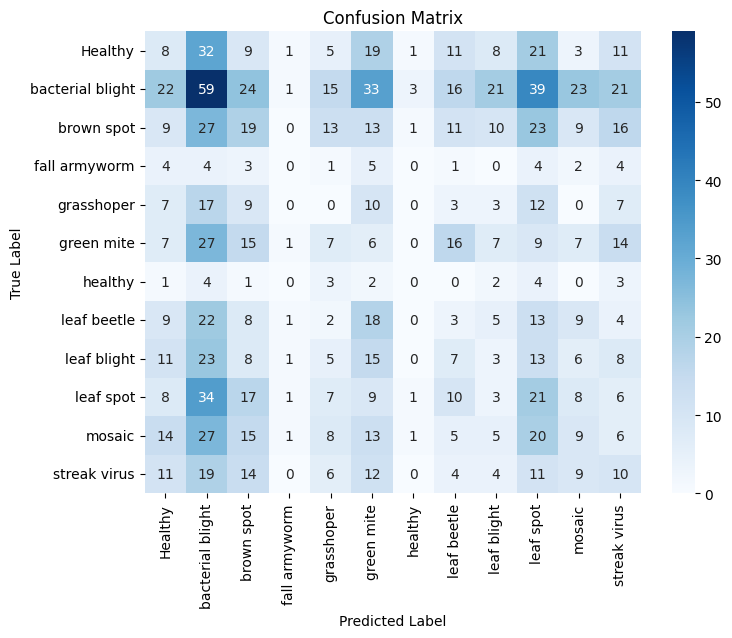

In [48]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## CNN FOR 20 EPOCHS

In [49]:
# Train the model
history1 = model.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step - accuracy: 0.7267 - loss: 0.7645
Epoch 1: val_loss improved from 0.66766 to 0.60923, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 427ms/step - accuracy: 0.7267 - loss: 0.7645 - val_accuracy: 0.7769 - val_loss: 0.6092
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step - accuracy: 0.7296 - loss: 0.7879
Epoch 2: val_loss improved from 0.60923 to 0.59280, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 139s 417ms/step - accuracy: 0.7296 - loss: 0.7879 - val_accuracy: 0.7889 - val_loss: 0.5928
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7392 - loss: 0.7420
Epoch 3: val_loss did not improve from 0.59280
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 414ms/step - accuracy: 0.7392 - loss: 0.7420 - val_accuracy: 0.7663 - val_loss: 0.6781
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7287 - loss: 0.7568
Epoch 4: val_loss did not improve from 0.59280
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 414ms/step - accuracy: 0.7287 - loss: 0.7568 - val_accuracy: 0.7784 - val_loss: 0.6487
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.7352 - loss: 0.7606
Epoch 5: val_loss improved from 0.59280 to 0.55957, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 410ms/step - accuracy: 0.7351 - loss: 0.7606 - val_accuracy: 0.7896 - val_loss: 0.5596
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7460 - loss: 0.7152
Epoch 6: val_loss did not improve from 0.55957
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 413ms/step - accuracy: 0.7460 - loss: 0.7152 - val_accuracy: 0.7663 - val_loss: 0.6538
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.7369 - loss: 0.7379
Epoch 7: val_loss did not improve from 0.55957
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 410ms/step - accuracy: 0.7369 - loss: 0.7379 - val_accuracy: 0.7896 - val_loss: 0.6038
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - accuracy: 0.7460 - loss: 0.7322
Epoch 8: val_loss did not improve from 0.55957
333/333 ━━━━━━━━━━━━━━━━━━━━ 135s 406ms/step - accuracy: 0.7460 - loss: 0.7321 - val_accuracy: 0.7904 - val_loss: 0.6124
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.7570 - loss: 0.6845
Epoch 9: val_loss did n

333/333 ━━━━━━━━━━━━━━━━━━━━ 139s 418ms/step - accuracy: 0.7545 - loss: 0.6538 - val_accuracy: 0.8017 - val_loss: 0.5450
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.7613 - loss: 0.6837
Epoch 14: val_loss improved from 0.54499 to 0.52433, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 419ms/step - accuracy: 0.7613 - loss: 0.6836 - val_accuracy: 0.8092 - val_loss: 0.5243
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.7579 - loss: 0.6705
Epoch 15: val_loss improved from 0.52433 to 0.50761, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 411ms/step - accuracy: 0.7579 - loss: 0.6704 - val_accuracy: 0.8114 - val_loss: 0.5076
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7678 - loss: 0.6356
Epoch 16: val_loss did not improve from 0.50761
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 413ms/step - accuracy: 0.7678 - loss: 0.6357 - val_accuracy: 0.8212 - val_loss: 0.5119
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step - accuracy: 0.7704 - loss: 0.6341
Epoch 17: val_loss did not improve from 0.50761
333/333 ━━━━━━━━━━━━━━━━━━━━ 139s 417ms/step - accuracy: 0.7704 - loss: 0.6341 - val_accuracy: 0.8017 - val_loss: 0.5603
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.7713 - loss: 0.6302
Epoch 18: val_loss did not improve from 0.50761
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 415ms/step - accuracy: 0.7712 - loss: 0.6303 - val_accuracy: 0.8039 - val_loss: 0.5543
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.7713 - loss: 0.6556
Epoch 19: val_lo

333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 414ms/step - accuracy: 0.7713 - loss: 0.6555 - val_accuracy: 0.8099 - val_loss: 0.5035
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.7639 - loss: 0.6462
Epoch 20: val_loss improved from 0.50351 to 0.46412, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 420ms/step - accuracy: 0.7639 - loss: 0.6461 - val_accuracy: 0.8249 - val_loss: 0.4641
42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 173ms/step - accuracy: 0.8258 - loss: 0.4880
Test accuracy: 0.8258


## training and validation accuracy and loss of cnn on 20 epoch

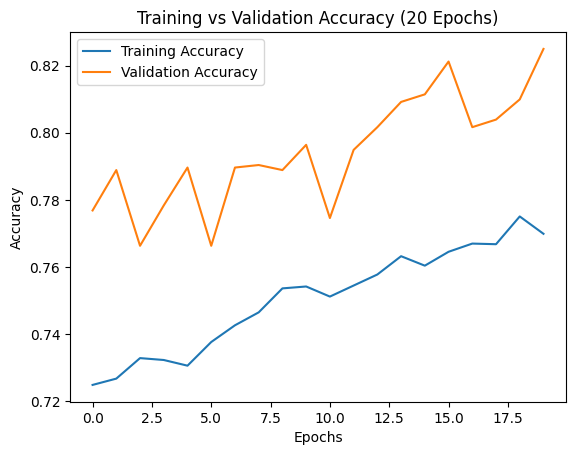

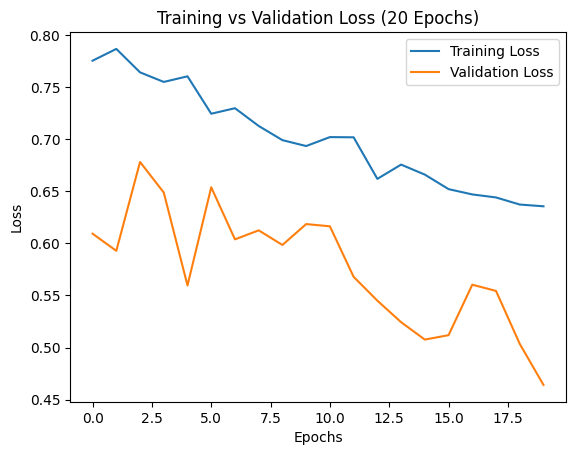

In [50]:
# Plot the training and validation accuracy for 20 epochs
plt.plot(history1.history['accuracy'], label='Training Accuracy')
plt.plot(history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (20 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(history1.history['loss'], label='Training Loss')
plt.plot(history1.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (20 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

 ## evaluation of cnn model on 20 epoch

42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.09      0.09      0.09       129
bacterial blight       0.19      0.21      0.20       277
      brown spot       0.12      0.13      0.12       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.07      0.07      0.07        68
      green mite       0.08      0.08      0.08       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.06      0.05      0.05        94
     leaf blight       0.08      0.07      0.08       100
       leaf spot       0.06      0.07      0.07       125
          mosaic       0.09      0.08      0.08       124
    streak virus       0.05      0.05      0.05       100

        accuracy                           0.11      1332
       macro avg       0.08      0.08      0.08      1332
    weighted avg       0.10      0.11      0.10      1332



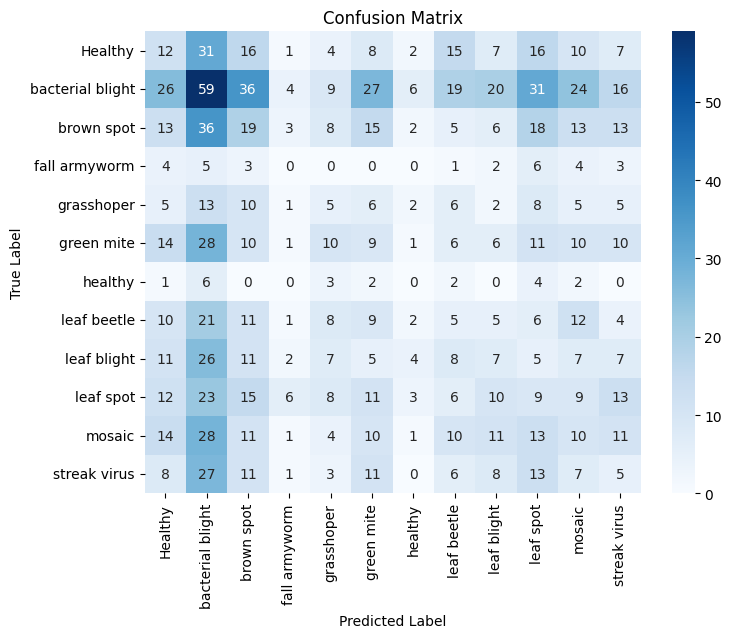

In [51]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## CNN model on 30 epoch

In [52]:
# Train the model
history2 = model.fit(train_generator, epochs=30, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.7726 - loss: 0.6370
Epoch 1: val_loss did not improve from 0.46412
333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 420ms/step - accuracy: 0.7725 - loss: 0.6371 - val_accuracy: 0.8039 - val_loss: 0.5268
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step - accuracy: 0.7690 - loss: 0.6430
Epoch 2: val_loss did not improve from 0.46412
333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 426ms/step - accuracy: 0.7690 - loss: 0.6429 - val_accuracy: 0.8002 - val_loss: 0.5726
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step - accuracy: 0.7780 - loss: 0.6210
Epoch 3: val_loss did not improve from 0.46412
333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 421ms/step - accuracy: 0.7780 - loss: 0.6209 - val_accuracy: 0.8017 - val_loss: 0.5380
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step - accuracy: 0.7719 - loss: 0.6123
Epoch 4: val_loss did not improve from 0.46412
333/333 ━━━━━━━━━━━━━━━━━━━━ 143s 430ms/step - accuracy: 0.7719 - loss: 0.6123 - val_accuracy: 0.

333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 427ms/step - accuracy: 0.7837 - loss: 0.5829 - val_accuracy: 0.8392 - val_loss: 0.4467
Epoch 10/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step - accuracy: 0.7919 - loss: 0.5797
Epoch 10: val_loss did not improve from 0.44668
333/333 ━━━━━━━━━━━━━━━━━━━━ 143s 428ms/step - accuracy: 0.7919 - loss: 0.5798 - val_accuracy: 0.8234 - val_loss: 0.4960
Epoch 11/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - accuracy: 0.7889 - loss: 0.5919
Epoch 11: val_loss did not improve from 0.44668
333/333 ━━━━━━━━━━━━━━━━━━━━ 143s 429ms/step - accuracy: 0.7889 - loss: 0.5919 - val_accuracy: 0.8219 - val_loss: 0.4893
Epoch 12/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.7884 - loss: 0.5873
Epoch 12: val_loss did not improve from 0.44668
333/333 ━━━━━━━━━━━━━━━━━━━━ 144s 432ms/step - accuracy: 0.7884 - loss: 0.5873 - val_accuracy: 0.8174 - val_loss: 0.4957
Epoch 13/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - accuracy: 0.7959 - loss: 0.5710
Epoch 13: val_lo

333/333 ━━━━━━━━━━━━━━━━━━━━ 143s 428ms/step - accuracy: 0.8066 - loss: 0.5529 - val_accuracy: 0.8347 - val_loss: 0.4278
Epoch 26/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step - accuracy: 0.8076 - loss: 0.5150
Epoch 26: val_loss did not improve from 0.42785
333/333 ━━━━━━━━━━━━━━━━━━━━ 144s 431ms/step - accuracy: 0.8076 - loss: 0.5151 - val_accuracy: 0.8340 - val_loss: 0.4498
Epoch 27/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.8090 - loss: 0.5357
Epoch 27: val_loss did not improve from 0.42785
333/333 ━━━━━━━━━━━━━━━━━━━━ 145s 435ms/step - accuracy: 0.8089 - loss: 0.5357 - val_accuracy: 0.8407 - val_loss: 0.4373
Epoch 28/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - accuracy: 0.8074 - loss: 0.5166
Epoch 28: val_loss did not improve from 0.42785
333/333 ━━━━━━━━━━━━━━━━━━━━ 144s 433ms/step - accuracy: 0.8074 - loss: 0.5166 - val_accuracy: 0.8287 - val_loss: 0.4524
Epoch 29/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - accuracy: 0.8061 - loss: 0.5476
Epoch 29: val_lo

## training and validation accuracy and loss of cnn on 30 epoch

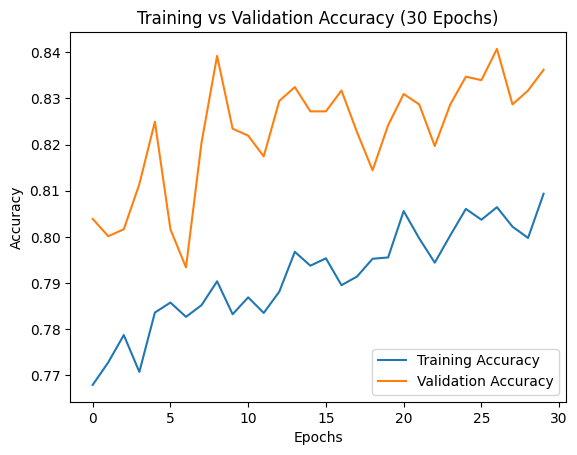

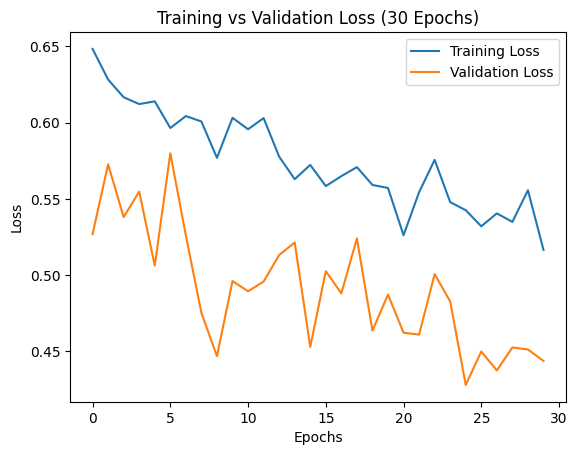

In [53]:
# Plot the training and validation accuracy for 30 epochs
plt.plot(history2.history['accuracy'], label='Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (30 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss for 30 epochs
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (30 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## evaluation of cnn model on 30 epoch

42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.10      0.10      0.10       129
bacterial blight       0.23      0.25      0.24       277
      brown spot       0.11      0.09      0.10       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.18      0.18      0.18        68
      green mite       0.10      0.09      0.10       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.06      0.06      0.06        94
     leaf blight       0.08      0.08      0.08       100
       leaf spot       0.10      0.10      0.10       125
          mosaic       0.08      0.08      0.08       124
    streak virus       0.08      0.09      0.09       100

        accuracy                           0.12      1332
       macro avg       0.09      0.09      0.09      1332
    weighted avg       0.12      0.12      0.12      1332



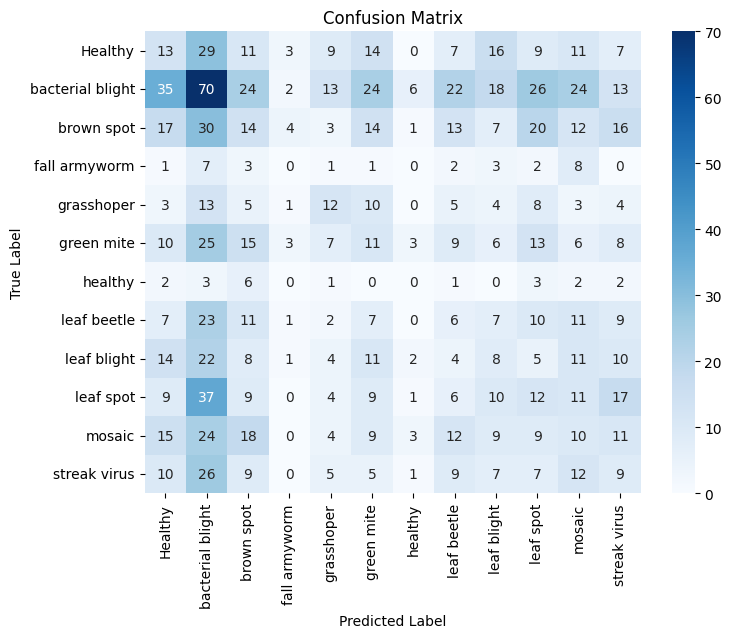

In [54]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## Algorithm comparison for 3 CNN Epoch models

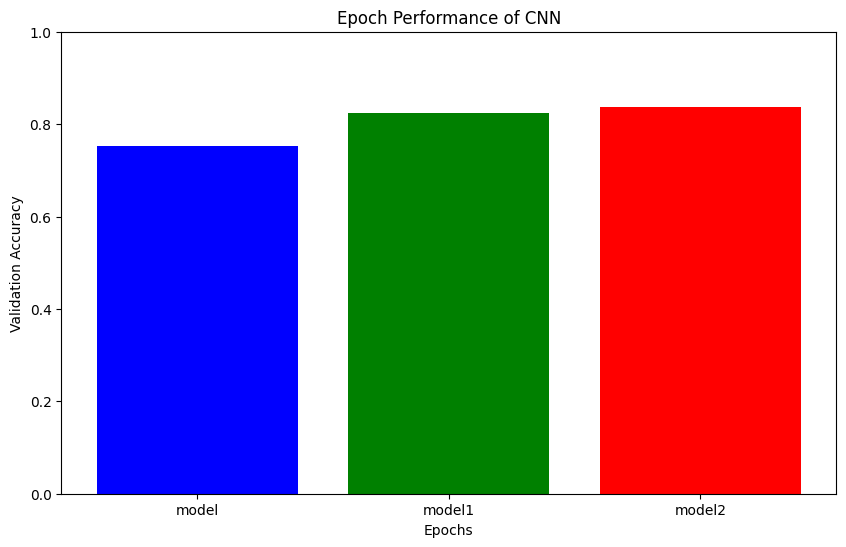

In [58]:
# Code to compare the cnn epoch performance of 10, 20, 30
accuracy_scores = [
    history.history['val_accuracy'][-1],  # Accuracy after 10 epochs
    history1.history['val_accuracy'][-1], # Accuracy after 20 epochs
    history2.history['val_accuracy'][-1]  # Accuracy after 30 epochs
]

algorithms = ['model', 'model1', 'model2']

plt.figure(figsize=(10, 6))
plt.bar(algorithms, accuracy_scores, color=['blue', 'green', 'red'])
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.title('Epoch Performance of CNN')
plt.ylim([0, 1])
plt.show()

# RESNET50 ON 10 EPOCHS


In [59]:
# Load pre-trained ResNet50 model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(150,150, 3))
base_model.trainable = False

# Build the model
ResNet50_model= Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')
])

# Compile the model
ResNet50_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
checkpoint = ModelCheckpoint('best_resnet_es.h5', monitor='val_loss',
                             save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5,
                               restore_best_weights=True, verbose=1)

# Train the model
history_resnet = ResNet50_model.fit(train_generator, epochs=10,
                                         validation_data=valid_generator,
                                         callbacks=[checkpoint, early_stopping])

# Evaluate the model
test_loss, test_accuracy = ResNet50_model.evaluate(test_generator)
print(f"Test accuracy with early stopping: {test_accuracy:.4f}")


Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 595ms/step - accuracy: 0.1806 - loss: 2.4112
Epoch 1: val_loss improved from inf to 2.25641, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 229s 673ms/step - accuracy: 0.1807 - loss: 2.4110 - val_accuracy: 0.2081 - val_loss: 2.2564
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 579ms/step - accuracy: 0.2057 - loss: 2.3011
Epoch 2: val_loss improved from 2.25641 to 2.17736, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 218s 652ms/step - accuracy: 0.2057 - loss: 2.3011 - val_accuracy: 0.2081 - val_loss: 2.1774
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 598ms/step - accuracy: 0.2135 - loss: 2.2378
Epoch 3: val_loss did not improve from 2.17736
333/333 ━━━━━━━━━━━━━━━━━━━━ 225s 674ms/step - accuracy: 0.2135 - loss: 2.2377 - val_accuracy: 0.2104 - val_loss: 2.1849
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 597ms/step - accuracy: 0.2275 - loss: 2.2071
Epoch 4: val_loss improved from 2.17736 to 2.15059, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 224s 671ms/step - accuracy: 0.2275 - loss: 2.2071 - val_accuracy: 0.2149 - val_loss: 2.1506
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 591ms/step - accuracy: 0.2313 - loss: 2.2016
Epoch 5: val_loss improved from 2.15059 to 2.10435, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 222s 665ms/step - accuracy: 0.2313 - loss: 2.2016 - val_accuracy: 0.2645 - val_loss: 2.1043
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 598ms/step - accuracy: 0.2409 - loss: 2.1860
Epoch 6: val_loss improved from 2.10435 to 2.07793, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 224s 673ms/step - accuracy: 0.2408 - loss: 2.1860 - val_accuracy: 0.2727 - val_loss: 2.0779
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 598ms/step - accuracy: 0.2355 - loss: 2.1815
Epoch 7: val_loss improved from 2.07793 to 2.06390, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 225s 674ms/step - accuracy: 0.2355 - loss: 2.1814 - val_accuracy: 0.2915 - val_loss: 2.0639
Epoch 8/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 609ms/step - accuracy: 0.2425 - loss: 2.1631
Epoch 8: val_loss improved from 2.06390 to 2.04915, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 228s 685ms/step - accuracy: 0.2425 - loss: 2.1630 - val_accuracy: 0.2990 - val_loss: 2.0491
Epoch 9/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 603ms/step - accuracy: 0.2557 - loss: 2.1450
Epoch 9: val_loss improved from 2.04915 to 2.03686, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 226s 676ms/step - accuracy: 0.2557 - loss: 2.1451 - val_accuracy: 0.2930 - val_loss: 2.0369
Epoch 10/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 597ms/step - accuracy: 0.2580 - loss: 2.1529
Epoch 10: val_loss did not improve from 2.03686
333/333 ━━━━━━━━━━━━━━━━━━━━ 224s 672ms/step - accuracy: 0.2580 - loss: 2.1529 - val_accuracy: 0.2690 - val_loss: 2.0720
Restoring model weights from the end of the best epoch: 9.
42/42 ━━━━━━━━━━━━━━━━━━━━ 25s 595ms/step - accuracy: 0.3071 - loss: 2.0412
Test accuracy with early stopping: 0.2980


## Training and Validation Accuracy and Loss 10 Epochs

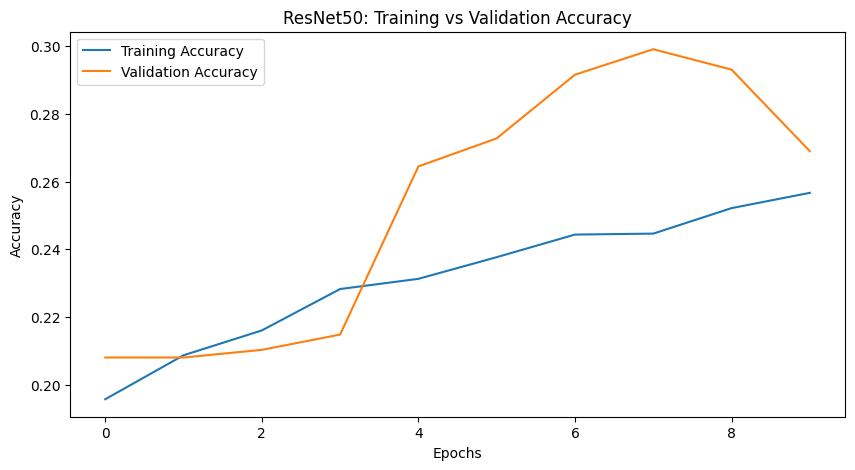

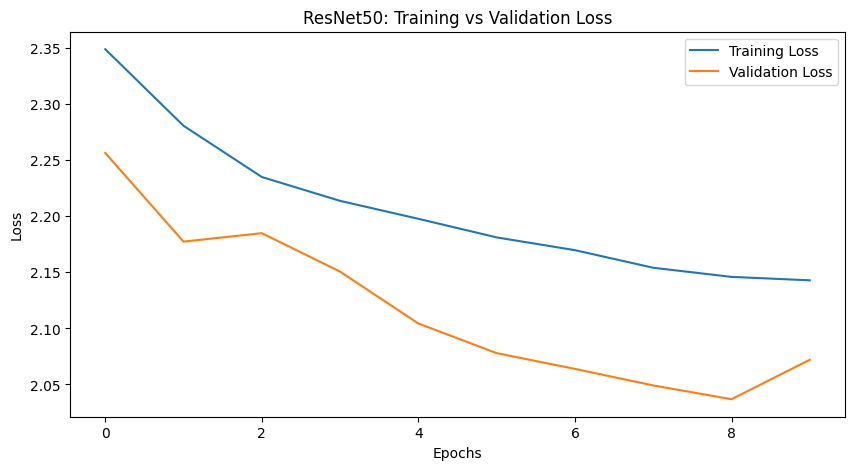

In [60]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history_resnet.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet.history['val_accuracy'], label='Validation Accuracy')
plt.title('ResNet50: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history_resnet.history['loss'], label='Training Loss')
plt.plot(history_resnet.history['val_loss'], label='Validation Loss')
plt.title('ResNet50: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model evaluation for 10 epochs RESNET50

42/42 ━━━━━━━━━━━━━━━━━━━━ 27s 602ms/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.07      0.02      0.03       129
bacterial blight       0.21      0.77      0.33       277
      brown spot       0.00      0.00      0.00       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.00      0.00      0.00        68
      green mite       0.00      0.00      0.00       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.11      0.18      0.14        94
     leaf blight       0.00      0.00      0.00       100
       leaf spot       0.04      0.01      0.01       125
          mosaic       0.00      0.00      0.00       124
    streak virus       0.08      0.09      0.08       100

        accuracy                           0.18      1332
       macro avg       0.04      0.09      0.05      1332
    weighted avg       0.07      0.18      0.09      1332



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


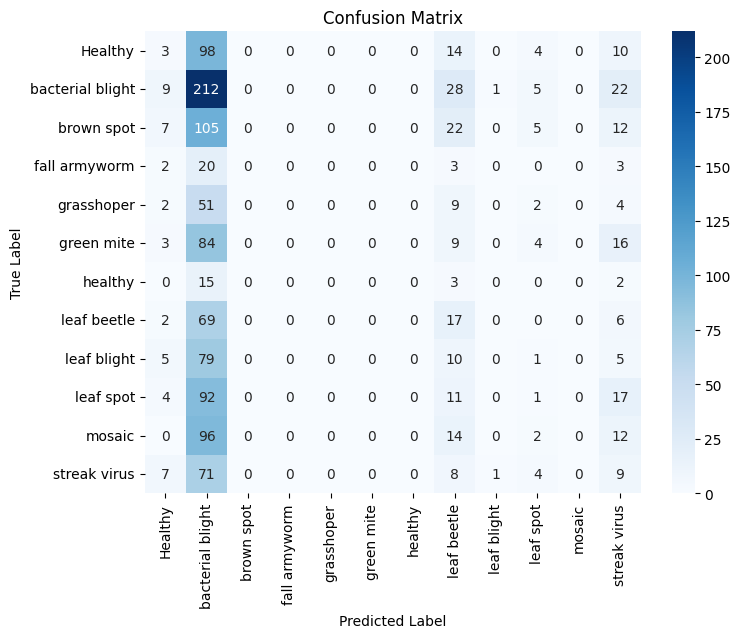

In [61]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = ResNet50_model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## RESNET50 ON 2O EPOCHS

In [62]:
# Load pre-trained ResNet50 model without early stopping
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(150,150, 3))
base_model.trainable = False

# Build the model
ResNet50_model1 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')
])

# Compile the model (no early stopping callback)
ResNet50_model1.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
# Train the model (no early stopping callback)
history_resnet1 = ResNet50_model1.fit(train_generator, epochs=20,
                                               validation_data=valid_generator,
                                               callbacks=[checkpoint]) # Only checkpoint
# Evaluate the model
test_loss, test_accuracy = ResNet50_model1.evaluate(test_generator)
print(f"Test accuracy without early stopping: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 603ms/step - accuracy: 0.1762 - loss: 2.3991
Epoch 1: val_loss did not improve from 2.03686
333/333 ━━━━━━━━━━━━━━━━━━━━ 234s 686ms/step - accuracy: 0.1763 - loss: 2.3990 - val_accuracy: 0.2081 - val_loss: 2.2786
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 618ms/step - accuracy: 0.2141 - loss: 2.2965
Epoch 2: val_loss did not improve from 2.03686
333/333 ━━━━━━━━━━━━━━━━━━━━ 231s 694ms/step - accuracy: 0.2141 - loss: 2.2965 - val_accuracy: 0.2675 - val_loss: 2.2043
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 610ms/step - accuracy: 0.2206 - loss: 2.2559
Epoch 3: val_loss did not improve from 2.03686
333/333 ━━━━━━━━━━━━━━━━━━━━ 228s 685ms/step - accuracy: 0.2206 - loss: 2.2558 - val_accuracy: 0.2134 - val_loss: 2.1638
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 607ms/step - accuracy: 0.2205 - loss: 2.2248
Epoch 4: val_loss did not improve from 2.03686
333/333 ━━━━━━━━━━━━━━━━━━━━ 260s 680ms/step - accuracy: 0.2206 - loss: 2.2247 - val_accuracy: 0.

333/333 ━━━━━━━━━━━━━━━━━━━━ 229s 687ms/step - accuracy: 0.2469 - loss: 2.1452 - val_accuracy: 0.2923 - val_loss: 2.0330
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 609ms/step - accuracy: 0.2584 - loss: 2.1378
Epoch 11: val_loss improved from 2.03302 to 2.02948, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 228s 685ms/step - accuracy: 0.2584 - loss: 2.1378 - val_accuracy: 0.3050 - val_loss: 2.0295
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 605ms/step - accuracy: 0.2566 - loss: 2.1335
Epoch 12: val_loss improved from 2.02948 to 2.02210, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 243s 730ms/step - accuracy: 0.2566 - loss: 2.1335 - val_accuracy: 0.3035 - val_loss: 2.0221
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 600ms/step - accuracy: 0.2714 - loss: 2.1246
Epoch 13: val_loss improved from 2.02210 to 2.00900, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 226s 679ms/step - accuracy: 0.2714 - loss: 2.1246 - val_accuracy: 0.3005 - val_loss: 2.0090
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 613ms/step - accuracy: 0.2603 - loss: 2.1184
Epoch 14: val_loss did not improve from 2.00900
333/333 ━━━━━━━━━━━━━━━━━━━━ 230s 688ms/step - accuracy: 0.2603 - loss: 2.1184 - val_accuracy: 0.2990 - val_loss: 2.0094
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 610ms/step - accuracy: 0.2609 - loss: 2.1131
Epoch 15: val_loss improved from 2.00900 to 1.99997, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 229s 687ms/step - accuracy: 0.2610 - loss: 2.1132 - val_accuracy: 0.3028 - val_loss: 2.0000
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 619ms/step - accuracy: 0.2562 - loss: 2.1175
Epoch 16: val_loss improved from 1.99997 to 1.98807, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 232s 696ms/step - accuracy: 0.2562 - loss: 2.1175 - val_accuracy: 0.3058 - val_loss: 1.9881
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 618ms/step - accuracy: 0.2712 - loss: 2.0983
Epoch 17: val_loss did not improve from 1.98807
333/333 ━━━━━━━━━━━━━━━━━━━━ 232s 695ms/step - accuracy: 0.2712 - loss: 2.0983 - val_accuracy: 0.2983 - val_loss: 2.0411
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 614ms/step - accuracy: 0.2743 - loss: 2.1042
Epoch 18: val_loss did not improve from 1.98807
333/333 ━━━━━━━━━━━━━━━━━━━━ 229s 688ms/step - accuracy: 0.2743 - loss: 2.1042 - val_accuracy: 0.2863 - val_loss: 2.0422
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 618ms/step - accuracy: 0.2720 - loss: 2.0970
Epoch 19: val_loss improved from 1.98807 to 1.95722, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 232s 696ms/step - accuracy: 0.2720 - loss: 2.0970 - val_accuracy: 0.3171 - val_loss: 1.9572
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 628ms/step - accuracy: 0.2759 - loss: 2.0883
Epoch 20: val_loss did not improve from 1.95722
333/333 ━━━━━━━━━━━━━━━━━━━━ 235s 705ms/step - accuracy: 0.2759 - loss: 2.0883 - val_accuracy: 0.3156 - val_loss: 1.9663
42/42 ━━━━━━━━━━━━━━━━━━━━ 26s 615ms/step - accuracy: 0.2919 - loss: 1.9914
Test accuracy without early stopping: 0.2988


## Training and validation accuracy and loss on 20 epochs

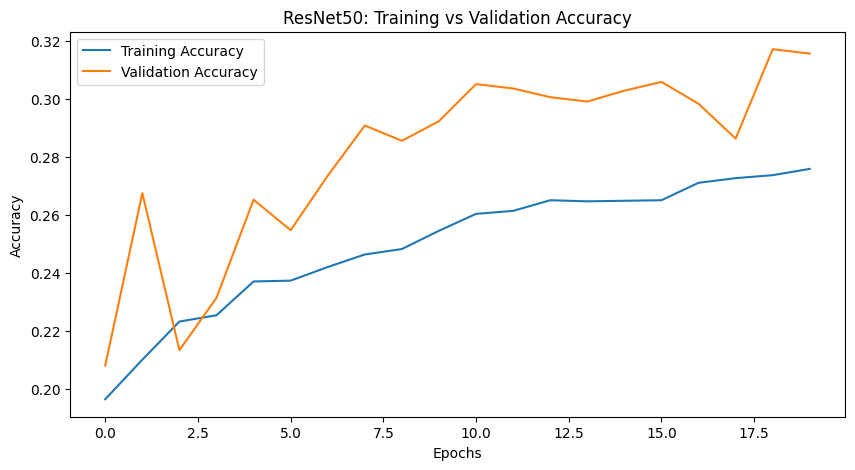

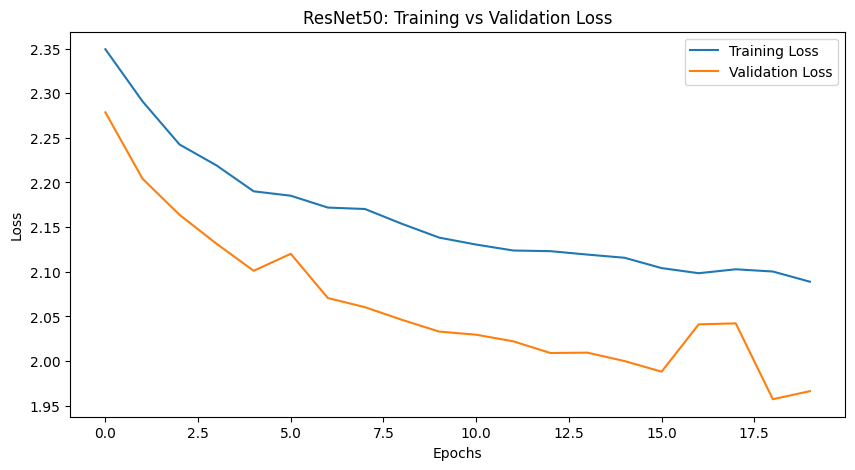

In [63]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history_resnet1.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet1.history['val_accuracy'], label='Validation Accuracy')
plt.title('ResNet50: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history_resnet1.history['loss'], label='Training Loss')
plt.plot(history_resnet1.history['val_loss'], label='Validation Loss')
plt.title('ResNet50: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##  Model evaluation RESNET50 on 20 epochs

42/42 ━━━━━━━━━━━━━━━━━━━━ 31s 688ms/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.11      0.20      0.14       129
bacterial blight       0.21      0.60      0.31       277
      brown spot       0.00      0.00      0.00       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.00      0.00      0.00        68
      green mite       0.00      0.00      0.00       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.09      0.07      0.08        94
     leaf blight       0.19      0.03      0.05       100
       leaf spot       0.17      0.11      0.13       125
          mosaic       0.00      0.00      0.00       124
    streak virus       0.08      0.11      0.09       100

        accuracy                           0.17      1332
       macro avg       0.07      0.09      0.07      1332
    weighted avg       0.10      0.17      0.11      1332



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


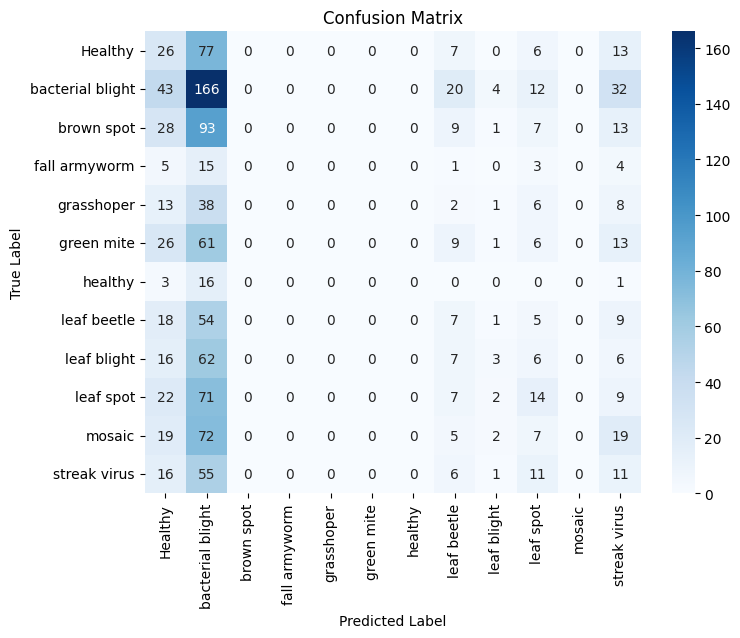

In [67]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = ResNet50_model1.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## RESNET5O ON 30 EPOCHS

In [64]:
# Load pre-trained ResNet50 model without early stopping
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(150,150, 3))
base_model.trainable = False

# Build the model
ResNet50_model2 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')
])

# Compile the model (no early stopping callback)
ResNet50_model2.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
# Train the model (no early stopping callback)
history_resnet2 = ResNet50_model2.fit(train_generator, epochs=30,
                                               validation_data=valid_generator,
                                               callbacks=[checkpoint]) # Only checkpoint
# Evaluate the model
test_loss, test_accuracy = ResNet50_model2.evaluate(test_generator)
print(f"Test accuracy without early stopping: {test_accuracy:.4f}")

Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - accuracy: 0.1938 - loss: 2.4252
Epoch 1: val_loss did not improve from 1.95722
333/333 ━━━━━━━━━━━━━━━━━━━━ 249s 730ms/step - accuracy: 0.1938 - loss: 2.4250 - val_accuracy: 0.2081 - val_loss: 2.2773
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 656ms/step - accuracy: 0.2077 - loss: 2.3043
Epoch 2: val_loss did not improve from 1.95722
333/333 ━━━━━━━━━━━━━━━━━━━━ 246s 737ms/step - accuracy: 0.2077 - loss: 2.3042 - val_accuracy: 0.2081 - val_loss: 2.1880
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 657ms/step - accuracy: 0.2171 - loss: 2.2576
Epoch 3: val_loss did not improve from 1.95722
333/333 ━━━━━━━━━━━━━━━━━━━━ 246s 739ms/step - accuracy: 0.2171 - loss: 2.2575 - val_accuracy: 0.2487 - val_loss: 2.1451
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - accuracy: 0.2255 - loss: 2.2266
Epoch 4: val_loss did not improve from 1.95722
333/333 ━━━━━━━━━━━━━━━━━━━━ 245s 735ms/step - accuracy: 0.2255 - loss: 2.2266 - val_accuracy: 0.

333/333 ━━━━━━━━━━━━━━━━━━━━ 252s 756ms/step - accuracy: 0.2807 - loss: 2.0826 - val_accuracy: 0.3306 - val_loss: 1.9487
Epoch 24/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 676ms/step - accuracy: 0.2768 - loss: 2.0781
Epoch 24: val_loss did not improve from 1.94872
333/333 ━━━━━━━━━━━━━━━━━━━━ 252s 756ms/step - accuracy: 0.2768 - loss: 2.0781 - val_accuracy: 0.3103 - val_loss: 2.0019
Epoch 25/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 651ms/step - accuracy: 0.2745 - loss: 2.0809
Epoch 25: val_loss improved from 1.94872 to 1.93127, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 244s 732ms/step - accuracy: 0.2745 - loss: 2.0809 - val_accuracy: 0.3373 - val_loss: 1.9313
Epoch 26/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 655ms/step - accuracy: 0.2827 - loss: 2.0744
Epoch 26: val_loss improved from 1.93127 to 1.92090, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 246s 737ms/step - accuracy: 0.2827 - loss: 2.0744 - val_accuracy: 0.3418 - val_loss: 1.9209
Epoch 27/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 677ms/step - accuracy: 0.2902 - loss: 2.0374
Epoch 27: val_loss improved from 1.92090 to 1.90044, saving model to best_resnet_es.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 254s 760ms/step - accuracy: 0.2902 - loss: 2.0374 - val_accuracy: 0.3373 - val_loss: 1.9004
Epoch 28/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 661ms/step - accuracy: 0.2905 - loss: 2.0556
Epoch 28: val_loss did not improve from 1.90044
333/333 ━━━━━━━━━━━━━━━━━━━━ 248s 743ms/step - accuracy: 0.2905 - loss: 2.0556 - val_accuracy: 0.3351 - val_loss: 1.9289
Epoch 29/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 660ms/step - accuracy: 0.2826 - loss: 2.0624
Epoch 29: val_loss did not improve from 1.90044
333/333 ━━━━━━━━━━━━━━━━━━━━ 248s 743ms/step - accuracy: 0.2826 - loss: 2.0624 - val_accuracy: 0.3449 - val_loss: 1.9035
Epoch 30/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 671ms/step - accuracy: 0.2804 - loss: 2.0590
Epoch 30: val_loss did not improve from 1.90044
333/333 ━━━━━━━━━━━━━━━━━━━━ 251s 754ms/step - accuracy: 0.2804 - loss: 2.0590 - val_accuracy: 0.3434 - val_loss: 1.9137
42/42 ━━━━━━━━━━━━━━━━━━━━ 28s 653ms/step - accuracy: 0.3672 - loss: 1.9017
Test accuracy without early s

## Training and validation accuraacy, loss on 30 epochs

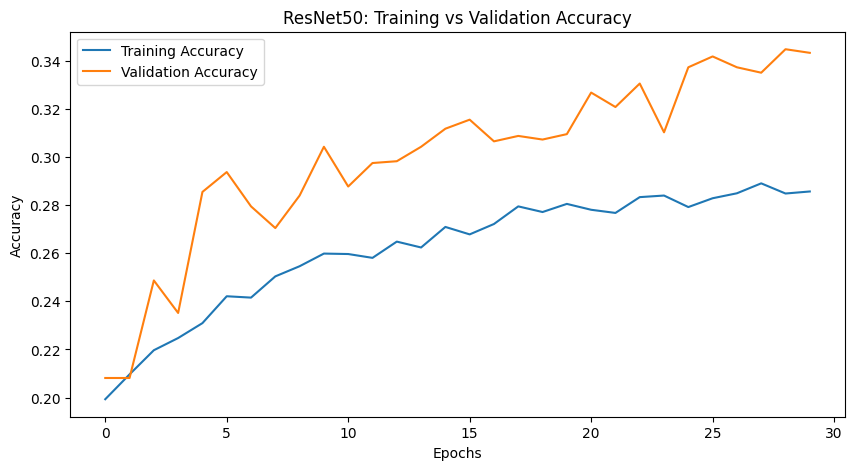

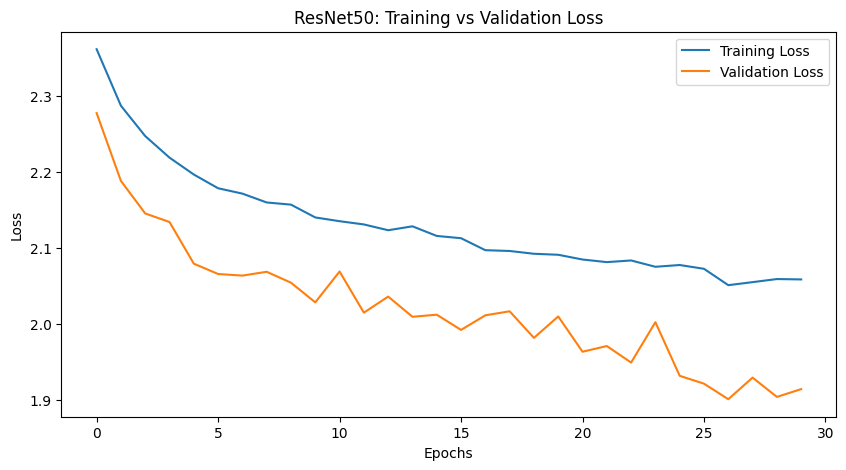

In [65]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history_resnet2.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet2.history['val_accuracy'], label='Validation Accuracy')
plt.title('ResNet50: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history_resnet2.history['loss'], label='Training Loss')
plt.plot(history_resnet2.history['val_loss'], label='Validation Loss')
plt.title('ResNet50: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model evaluation for RESNET50 on 30 epochs

In [1]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = ResNet50_model2.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

NameError: name 'test_generator' is not defined